In [1]:
# this jupiter notebook is for using opensoundscape to visualize spectrograms from training data or original annotations 

In [6]:
import opensoundscape
import glob
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import librosa
import torch
import random
import sys

import cv2

In [3]:
# load datasets
CC_2004_07 = pd.read_csv('modified_annotations/MasterSheet_modification.csv')


In [43]:
# """ # plot spectrograms from each deployment
# # CalCOFI-2004-07
# for index, row in CC_2004_07.iterrows():

#     audio_file_name = os.path.split(row['audio_file'])[1]
#     audio = opensoundscape.Audio.from_file(row['audio_file'], sample_rate=48000, offset=row['start_time'], duration=6)

#     if audio.samples.shape[0] > 0:  # Assuming audio.samples returns a numpy array of audio samples
#         # create spectrogram:
#         spec = opensoundscape.Spectrogram.from_audio(audio, window_type='hamming', window_samples=24000, 
#                                                      overlap_samples=21600, fft_size=48000, 
#                                                      scaling='density')
        
#         # convert spectrogram to image:
#         spec_image = spec.bandpass(0, 200).to_image()

#     #spec = opensoundscape.Spectrogram.from_audio(audio, window_type='hamming', window_samples=24000, 
#                                                                 #overlap_samples=21600, fft_size=48000, 
#                                                                 #decibel_limits=(-100, 100), scaling='density')
#     else:
#         print(f"No audio samples found for file: {row['audio_file']}")

#     #spec_image = spec.bandpass(0, 200).to_image()
#     #plt.figure(figsize=(12, 8))
#     #plt.imshow(spec_image)
#     plt.title(f'Audio file: {audio_file_name} Call label: {row["annotation"]} start time: {row["start_time"]} end time: {r """ow["end_time"]}')

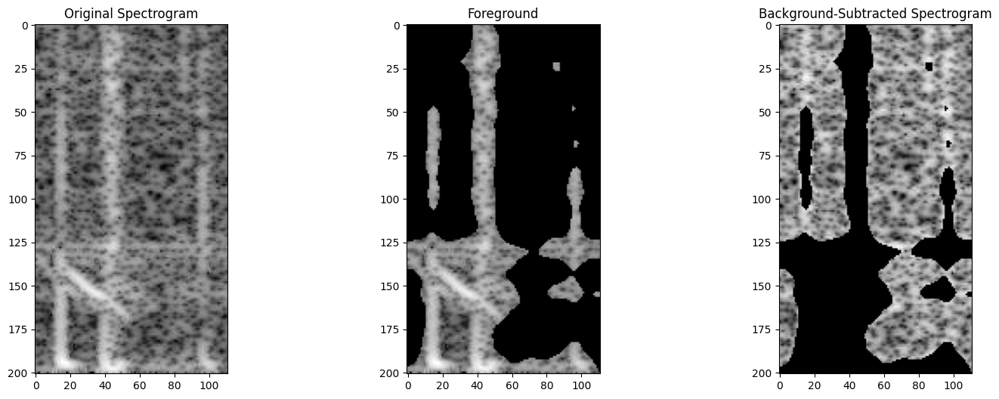

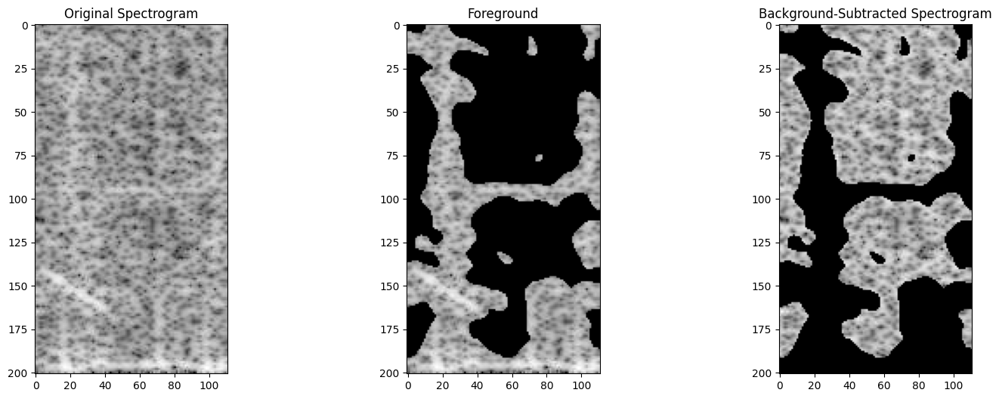

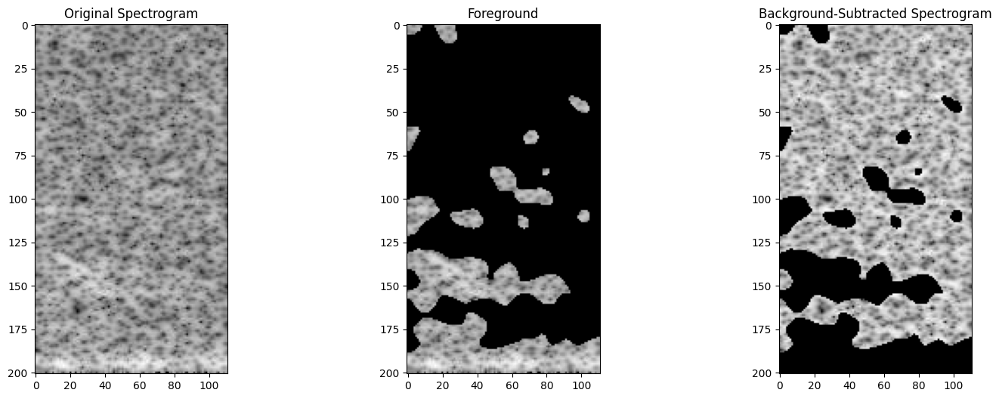

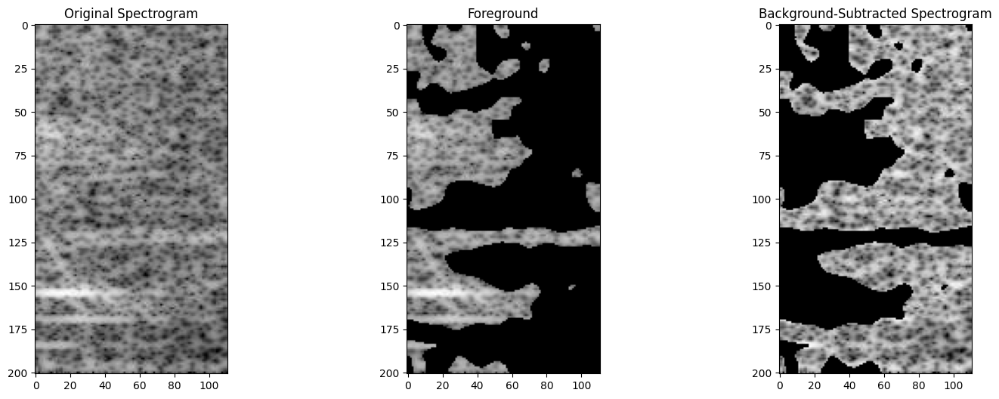

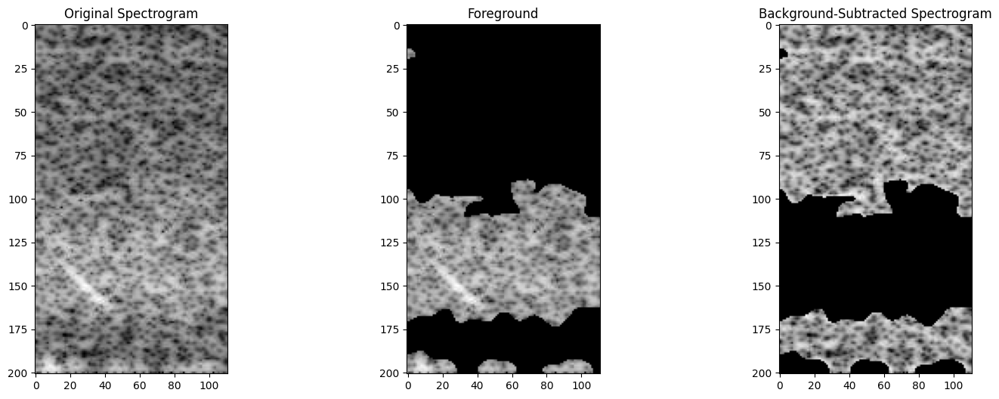

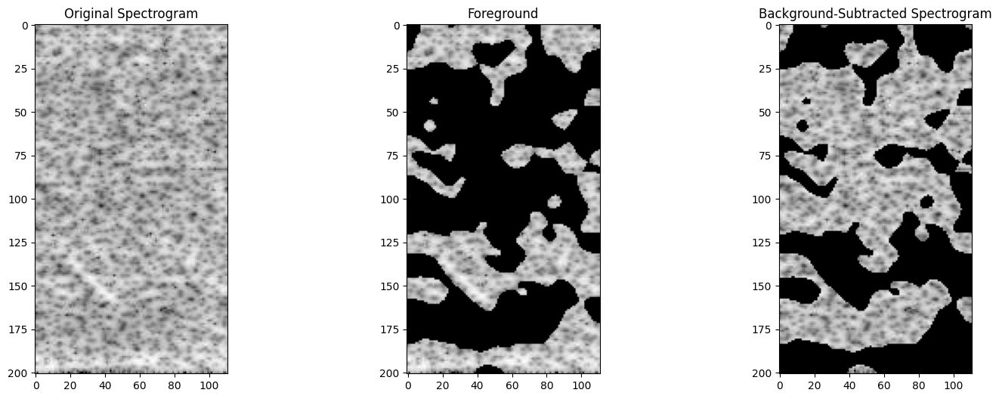

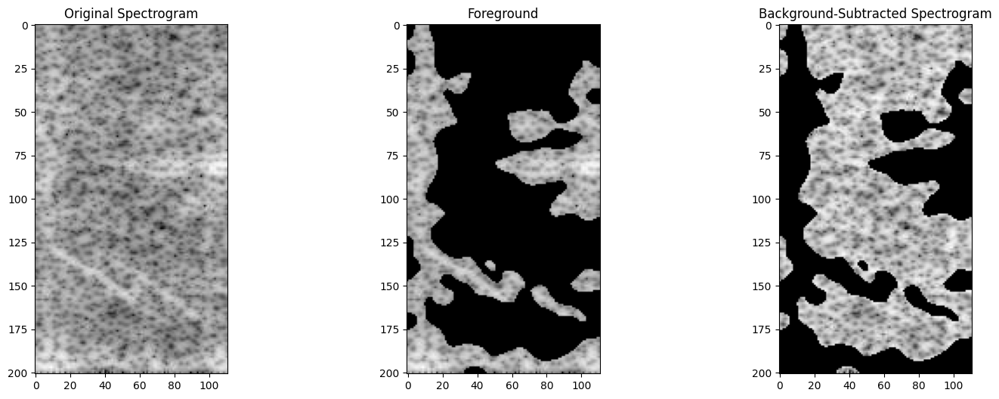

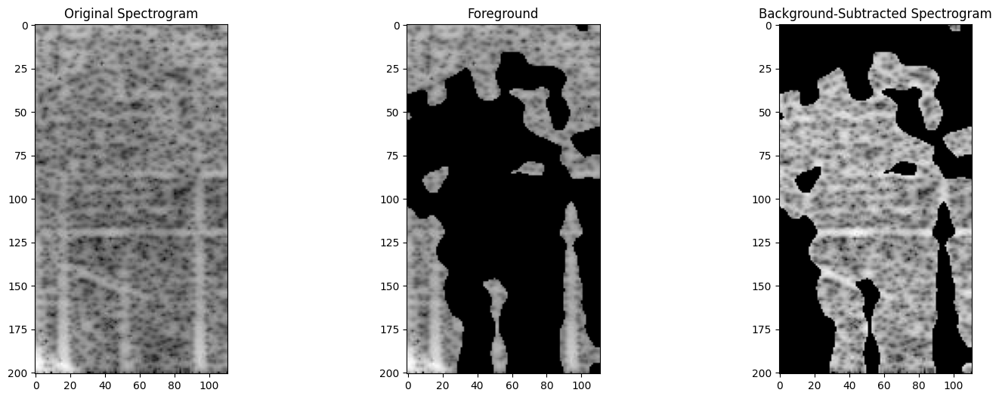

/Users/Kaitlyn/.virtualenvs/r-tensorflow/lib/python3.10/site-packages/opensoundscape/audio.py:328: UserWarning: audio object has zero samples
  warnings.warn(error_msg)


No audio samples found for file: /Users/Kaitlyn/Desktop/PSTAT197/master_wav_sonobuoy/CC0407-SB10-040717-223000.wav


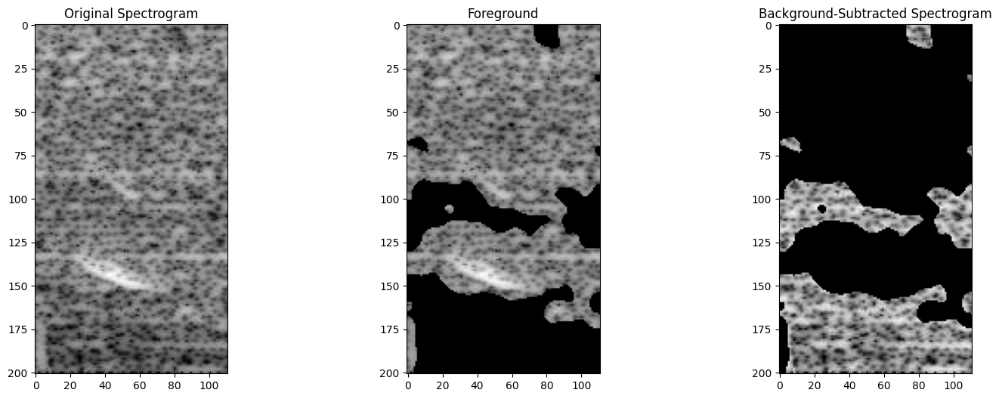

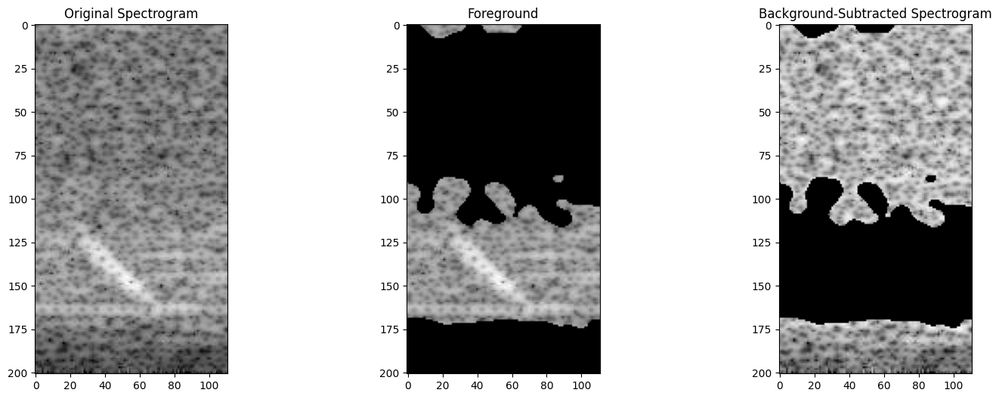

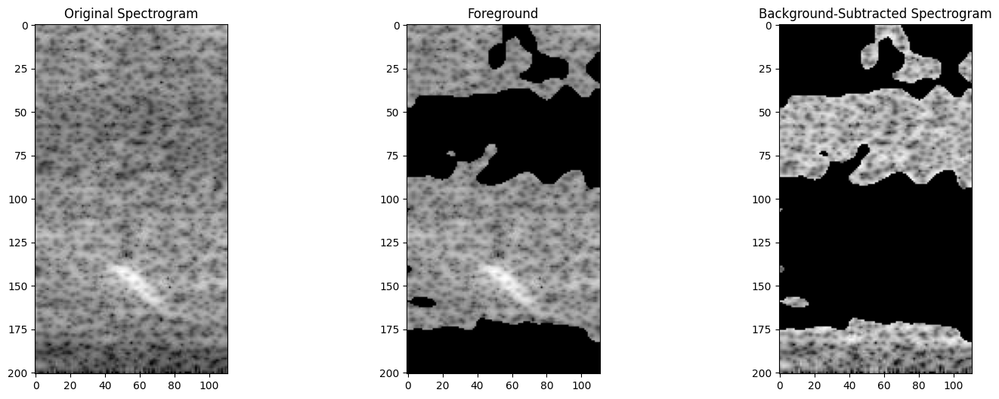

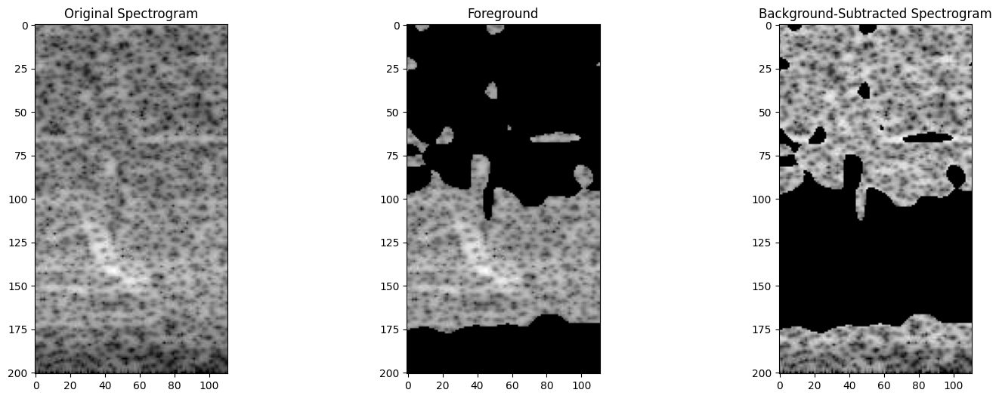

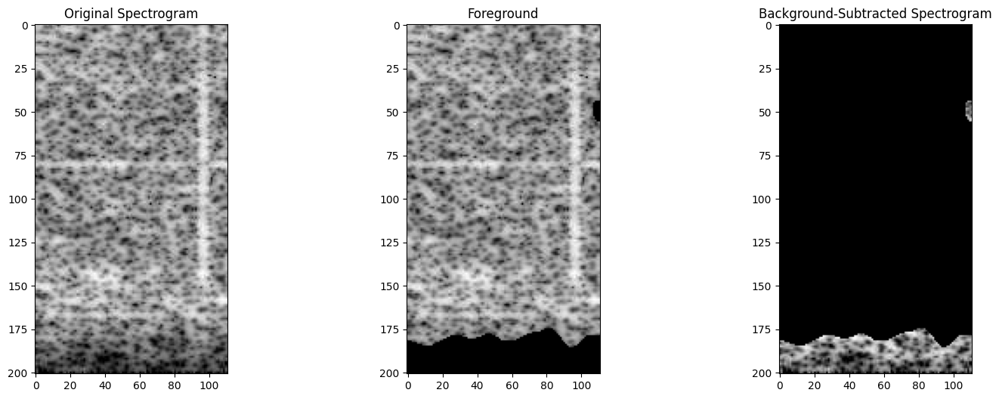

...

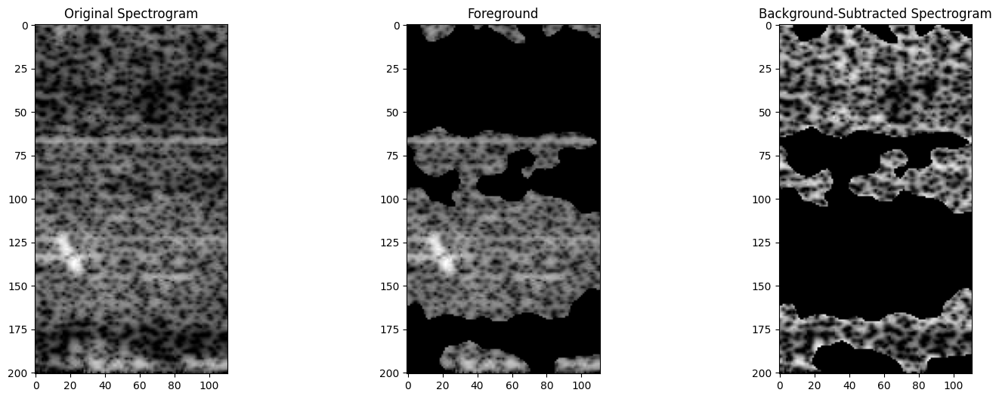

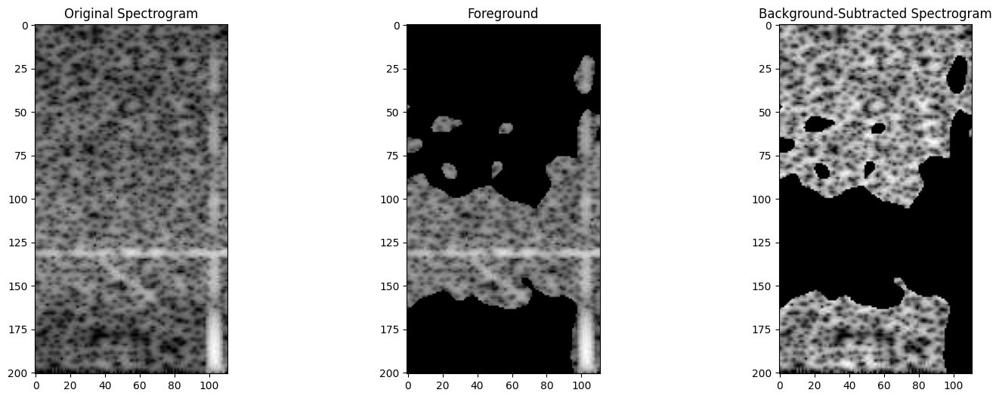

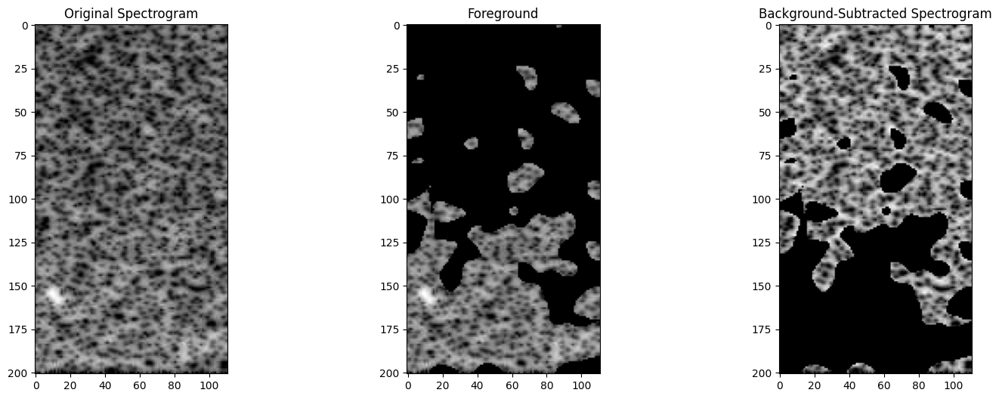

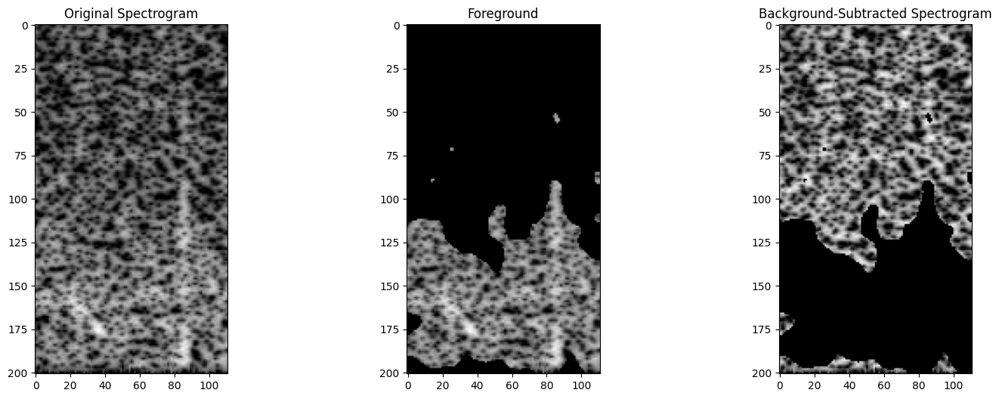

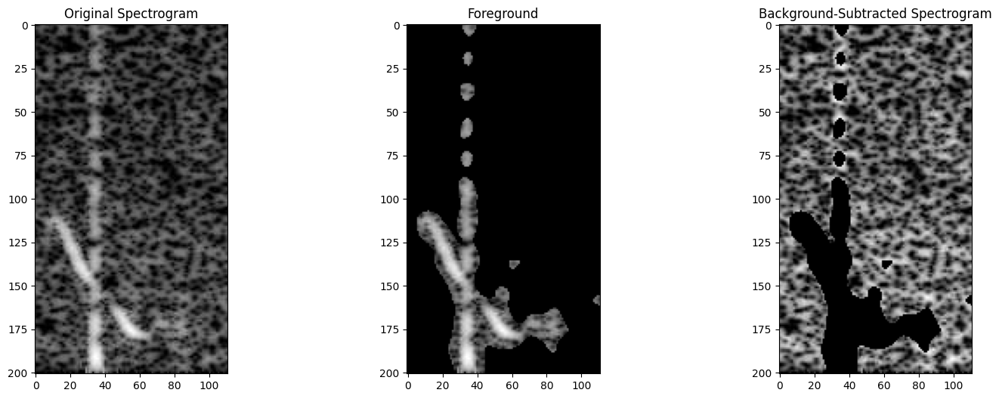

In [44]:
# plot spectrograms from each deployment
# CalCOFI-2004-07
for index, row in CC_2004_07.iterrows():

    audio_file_name = os.path.split(row['audio_file'])[1]
    audio = opensoundscape.Audio.from_file(row['audio_file'], sample_rate=48000, offset=row['start_time'], duration=6)

    if audio.samples.shape[0] > 0:  # Assuming audio.samples returns a numpy array of audio samples
        # create spectrogram:
        spec = opensoundscape.Spectrogram.from_audio(audio, window_type='hamming', window_samples=24000, 
                                                     overlap_samples=21600, fft_size=48000, 
                                                     scaling='density')
        
        # convert spectrogram to image:
        spec_image = spec.bandpass(0, 200).to_image()

        # save the image jpg:
        spec_image.save("spec.jpg")
        # re-load the image: 
        spec_image = spec_image = cv2.imread("spec.jpg")

        gray_spec = cv2.cvtColor(spec_image, cv2.COLOR_RGB2GRAY)

        # Apply GaussianBlur to smooth the image and reduce noise
        blurred_spec = cv2.GaussianBlur(gray_spec, (25,25), 0)

        # Use adaptive thresholding to separate the foreground from the background
        _, thresh = cv2.threshold(blurred_spec, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Find contours of the thresholded image
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Create an empty mask to store the foreground
        mask = np.zeros_like(gray_spec)

        # Draw the contours on the mask
        cv2.drawContours(mask, contours, -1, 255, thickness=cv2.FILLED)

        # Perform bitwise_and to get the foreground
        foreground = cv2.bitwise_and(gray_spec, mask)

        # Subtract the background from the original spectrogram
        background_subtracted_spec = gray_spec - foreground

        # Display the original spectrogram, foreground, and background-subtracted spectrogram
        plt.figure(figsize=(18, 6))

        plt.subplot(131)
        plt.imshow(gray_spec, cmap='gray')
        plt.title('Original Spectrogram')

        plt.subplot(132)
        plt.imshow(foreground, cmap='gray')
        plt.title('Foreground')

        plt.subplot(133)
        plt.imshow(background_subtracted_spec, cmap='gray')
        plt.title('Background-Subtracted Spectrogram')

        plt.show()




    #spec = opensoundscape.Spectrogram.from_audio(audio, window_type='hamming', window_samples=24000, 
                                                                #overlap_samples=21600, fft_size=48000, 
                                                                #decibel_limits=(-100, 100), scaling='density')
    else:
        print(f"No audio samples found for file: {row['audio_file']}")


/var/folders/2b/m36gp23n22gfsgzj3p3gv9km0000gp/T/ipykernel_85705/1212496415.py:1: ResourceWarning: unclosed file <_io.TextIOWrapper name='spec.jpg' mode='r' encoding='UTF-8'>
  spec_image = spec_image = cv2.imread("spec.jpg")


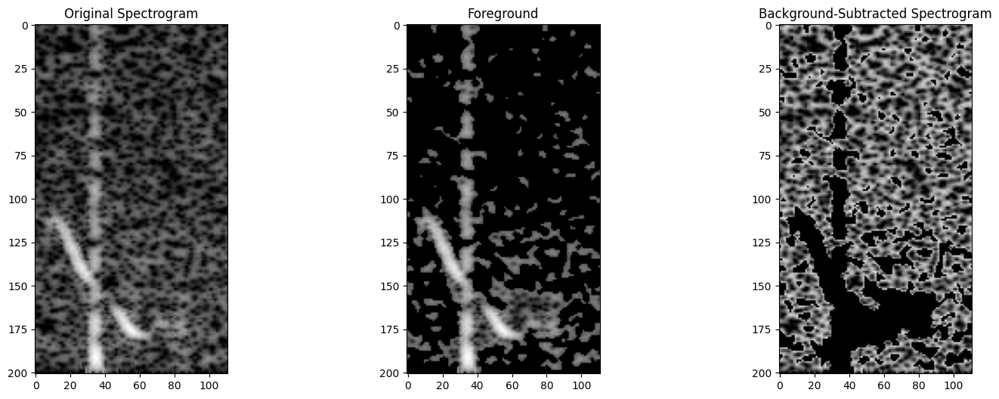

In [21]:
spec_image = spec_image = cv2.imread("spec.jpg")

gray_spec = cv2.cvtColor(spec_image, cv2.COLOR_RGB2GRAY)

# Apply GaussianBlur to smooth the image and reduce noise
blurred_spec = cv2.GaussianBlur(gray_spec, (5, 5), 0)

# Use adaptive thresholding to separate the foreground from the background
_, thresh = cv2.threshold(blurred_spec, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Find contours of the thresholded image
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an empty mask to store the foreground
mask = np.zeros_like(gray_spec)

# Draw the contours on the mask
cv2.drawContours(mask, contours, -1, 255, thickness=cv2.FILLED)

# Perform bitwise_and to get the foreground
foreground = cv2.bitwise_and(gray_spec, mask)

# Subtract the background from the original spectrogram
background_subtracted_spec = gray_spec - foreground

# Display the original spectrogram, foreground, and background-subtracted spectrogram
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.imshow(gray_spec, cmap='gray')
plt.title('Original Spectrogram')

plt.subplot(132)
plt.imshow(foreground, cmap='gray')
plt.title('Foreground')

plt.subplot(133)
plt.imshow(background_subtracted_spec, cmap='gray')
plt.title('Background-Subtracted Spectrogram')

plt.show()

In [ ]:
dio_file_name} Call label: {row["annotation"]} start time: {row["start_time"]} end time: {row["end_time"]}')
    plt.axis('on')